In [1]:
#note this now uses rubin_sim package
# See https://community.lsst.org/t/announcing-rubin-sim/5881


from rubin_sim.maf.metrics.baseMetric import BaseMetric
from scipy import interpolate

import rubin_sim.maf.utils as mafUtils


%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import healpy as hp

import rubin_sim.maf.db as db
import rubin_sim.maf.utils as utils
import rubin_sim.maf.metrics as metrics
import rubin_sim.maf.slicers as slicers
import rubin_sim.maf.metricBundles as metricBundles
import rubin_sim.maf.plots as plots
import rubin_sim.maf.maps as maps
# need a different set of utils for the stellarmags
import rubin_sim.utils as sims_utils


import glob


In [2]:
# Copy and modify the ParallaxMetric

class BDParallaxMetric(BaseMetric):
    """Calculate the distance to which one could reach a parallax SNR for a given object

    Uses columns ra_pi_amp and dec_pi_amp, calculated by the ParallaxFactorStacker.

    Parameters
    ----------
    metricName : str, opt
        Default 'parallax'.
    m5Col : str, opt
        The default column name for m5 information in the input data. Default fiveSigmaDepth.
    filterCol : str, opt
        The column name for the filter information. Default filter.
    seeingCol : str, opt
        The column name for the seeing information. Since the astrometry errors are based on the physical
        size of the PSF, this should be the FWHM of the physical psf. Default seeingFwhmGeom.
    mags : dict
        The absolute magnitude of the obeject in question. Keys of filter name, values in mags.
    distances : np.array
        Distances to try putting the object at (pc).
    atm_err : float, opt
        The expected centroiding error due to the atmosphere, in arcseconds. Default 0.01.
    badval : float, opt
        The value to return when the metric value cannot be calculated. Default 0.
    """
    def __init__(self, metricName='bdParallax', m5Col='fiveSigmaDepth',
                 filterCol='filter', seeingCol='seeingFwhmGeom',
                 badval=0, mags={'z': 18.18, 'y': 17.13}, parallax_snr=10.,
                 distances=np.arange(10, 200, 20), 
                 atm_err=0.01, normalize=False, min_exp_time=15., 
                 exptimeCol='visitExposureTime', **kwargs):
        Cols = [m5Col, filterCol, seeingCol, exptimeCol, 'ra_pi_amp', 'dec_pi_amp']
        
        units = 'pc'
        super(BDParallaxMetric, self).__init__(Cols, metricName=metricName, units=units,
                                             badval=badval, **kwargs)
        # set return type
        self.m5Col = m5Col
        self.seeingCol = seeingCol
        self.filterCol = filterCol
        self.distances = distances
        self.exptimeCol = exptimeCol
        self.mags = {}
        distance_mod = 5.0*np.log10(distances)-5.0
        for key in mags:
            self.mags[key] = mags[key] + distance_mod
        self.parallax_snr_goal = parallax_snr
        self.atm_err = atm_err
        self.filters = list(self.mags.keys())
        self.parallaxes = 1000.0/distances  #mas
        self.min_exp_time = min_exp_time
        
    def _final_sigma(self, position_errors, ra_pi_amp, dec_pi_amp):
        """Assume parallax in RA and DEC are fit independently, then combined.
        All inputs assumed to be arcsec """
        sigma_A = position_errors/ra_pi_amp
        sigma_B = position_errors/dec_pi_amp
        sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
        sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
        # Combine RA and Dec uncertainties, convert to mas
        sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3
        return sigma

    def run(self, dataslice, slicePoint=None):
        snr = np.zeros((np.size(self.mags[self.filters[0]]), len(dataslice)), dtype='float')
        # compute SNR for all observations
        for filt in self.filters:
            if self.min_exp_time is not None:
                good = np.where((dataslice[self.filterCol] == filt) &
                                (dataslice[self.exptimeCol] >= self.min_exp_time))[0]
            else:
                good = np.where(dataslice[self.filterCol] == filt)[0]
            if np.size(good) > 0:
                snr[:, good] = mafUtils.m52snr(self.mags[str(filt)][:, np.newaxis],
                                               dataslice[self.m5Col][good])
                
        
        position_errors = np.sqrt(mafUtils.astrom_precision(dataslice[self.seeingCol],
                                                            snr)**2+self.atm_err**2)
        # uncertainty in the parallax in mas
        sigma = self._final_sigma(position_errors, dataslice['ra_pi_amp'], dataslice['dec_pi_amp'])
        fitted_parallax_snr = self.parallaxes/sigma
        result = self.badval
        # Let's interpolate to the distance where we would get our target SNR
        if np.max(fitted_parallax_snr) >= self.parallax_snr_goal:
            f = interpolate.interp1d(fitted_parallax_snr, self.distances, fill_value="extrapolate")
            result = f(self.parallax_snr_goal)
        return result

In [3]:
class VolumeSumMetric(BaseMetric):
    """Compute the total volume assuming a metric has values of distance
    """
    def __init__(self, col=None, metricName='VolumeSum', nside=None, **kwargs):
        super(VolumeSumMetric, self).__init__(col=col, metricName=metricName, **kwargs)
        self.pix_area = hp.nside2pixarea(nside)
        
    def run(self, dataSlice, slicePoint=None):
        # volume of sphere, times ratio of pixel area divided by area of sphere
        vols = 1./3. * dataSlice[self.colname]**3 * self.pix_area
        return np.sum(vols)

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2046745 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff0_delayed-1_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 774499 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff0_delayed-1_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2067452 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff0_delayed1827_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 783049 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff0_delayed1827_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2070980 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff1_delayed-1_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 788030 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff1_delayed-1_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2078434 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff1_delayed1827_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 791071 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff1_delayed1827_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.
Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2076198 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff2_delayed-1_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 791875 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff2_delayed-1_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2081844 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff2_delayed1827_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 793051 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff2_delayed1827_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:141: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(fignum, figsize=plotDict['figsize'])
0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2079329 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff3_delayed-1_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 792834 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff3_delayed-1_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2082889 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff3_delayed1827_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 794161 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff3_delayed1827_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2080392 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff4_delayed-1_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 794221 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff4_delayed-1_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2083856 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff4_delayed1827_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 794879 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff4_delayed1827_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2082106 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff5_delayed-1_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 793721 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff5_delayed-1_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2084570 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff5_delayed1827_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 794742 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff5_delayed1827_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2081933 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff6_delayed-1_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 794125 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff6_delayed-1_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2084436 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff6_delayed1827_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 794406 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff6_delayed1827_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']
Completed metric generation.
Running reduce methods.
Running summary statistics.


0.0 180.0 -180.0 180.0


Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2083825 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff7_delayed-1_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 795163 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff7_delayed-1_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2085109 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff7_delayed1827_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 795726 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_long_gaps_nightsoff7_delayed1827_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2028987 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff0_delayed-1_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 773284 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff0_delayed-1_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2059335 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff0_delayed1827_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 785538 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff0_delayed1827_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2064716 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff1_delayed-1_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 790879 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff1_delayed-1_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2075040 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff1_delayed1827_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 794730 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff1_delayed1827_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2072752 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff2_delayed-1_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 793573 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff2_delayed-1_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2080554 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff2_delayed1827_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 796135 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff2_delayed1827_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2077785 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff3_delayed-1_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 794802 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff3_delayed-1_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2082329 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff3_delayed1827_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 796083 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff3_delayed1827_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2078988 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff4_delayed-1_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 794404 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff4_delayed-1_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2082707 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff4_delayed1827_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 795646 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff4_delayed1827_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2080545 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff5_delayed-1_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 795483 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff5_delayed-1_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2083679 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff5_delayed1827_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 796630 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff5_delayed1827_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2080974 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff6_delayed-1_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 796047 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff6_delayed-1_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2083998 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff6_delayed1827_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 797455 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff6_delayed1827_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2082384 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff7_delayed-1_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 797835 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff7_delayed-1_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2084679 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff7_delayed1827_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 797140 visits
Running:  ['_sims_maf_fbs_2_0_long_gaps_nopair_long_gaps_np_nightsoff7_delayed1827_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2021286 visits
Running:  ['_sims_maf_fbs_2_0_long_u_long_u1_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 772678 visits
Running:  ['_sims_maf_fbs_2_0_long_u_long_u1_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database observations with no constraint for columns ['visitExposureTime', 'seeingFwhmGeom', 'fieldDec', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartMJD', 'rotSkyPos'].
Found 2040731 visits
Running:  ['_sims_maf_fbs_2_0_long_u_long_u2_v2_0_10yrs_L7_HEAL']


/data0/sw/lsst_stack-2021.10.13/rubin_sim/rubin_sim/maf/utils/astrometryUtils.py:72: RuntimeWarning: divide by zero encountered in true_divide
  result = fwhm/(snr)
<ipython-input-2-32808caa9442>:60: RuntimeWarning: divide by zero encountered in true_divide
  sigma_ra = np.sqrt(1./np.sum(1./sigma_A**2, axis=1))
<ipython-input-2-32808caa9442>:61: RuntimeWarning: divide by zero encountered in true_divide
  sigma_dec = np.sqrt(1./np.sum(1./sigma_B**2, axis=1))
<ipython-input-2-32808caa9442>:63: RuntimeWarning: divide by zero encountered in true_divide
  sigma = np.sqrt(1./(1./sigma_ra**2+1./sigma_dec**2))*1e3


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying database observations with constraint filter="z" or filter="y" for columns ['seeingFwhmGeom', 'fieldDec', 'altitude', 'filter', 'fieldRA', 'fiveSigmaDepth', 'observationStartLST', 'observationStartMJD', 'rotSkyPos']
Found 796965 visits
Running:  ['_sims_maf_fbs_2_0_long_u_long_u2_v2_0_10yrs_ParallaxDcrDegenMetric_z_or_y_HEAL']


0.0 180.0 -180.0 180.0


Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0


Plotting complete.
Plotting figures with "filter="z" or filter="y"" constraint now.
Plotting complete.


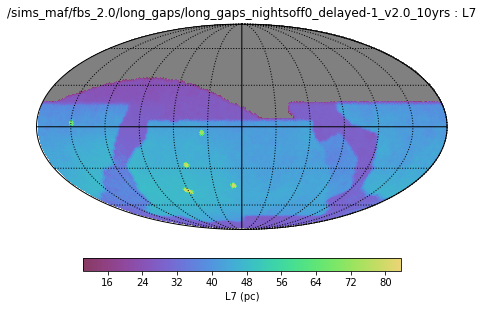

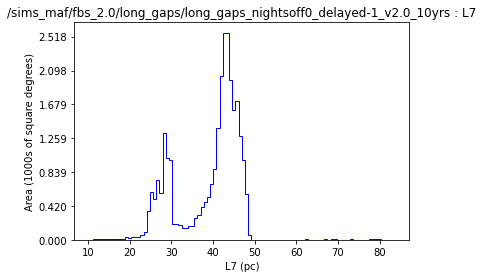

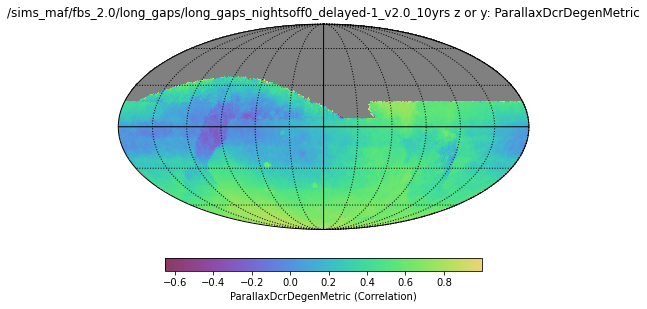

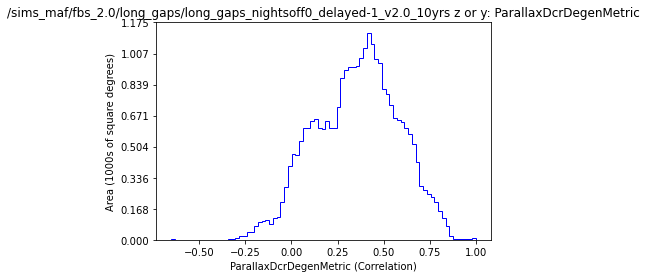

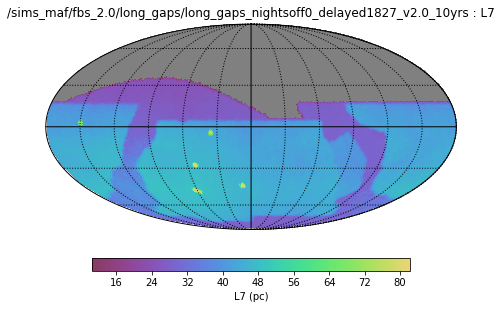

...

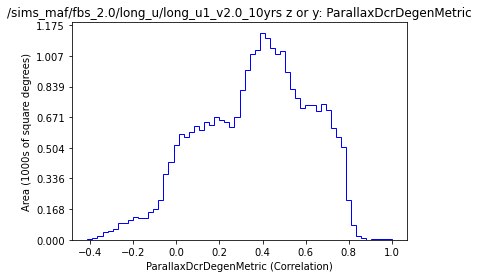

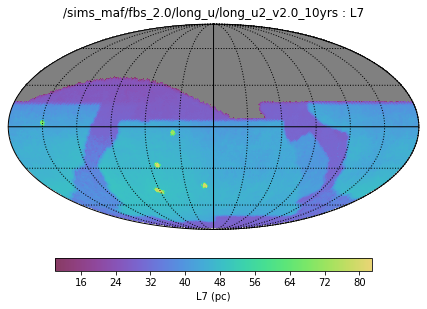

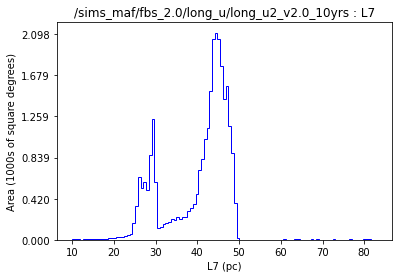

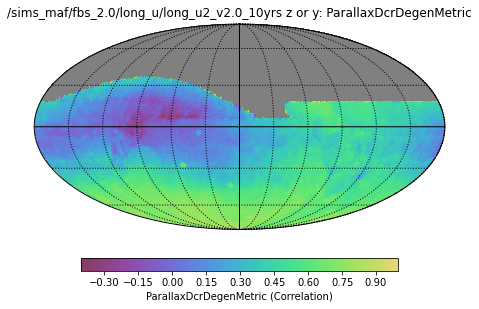

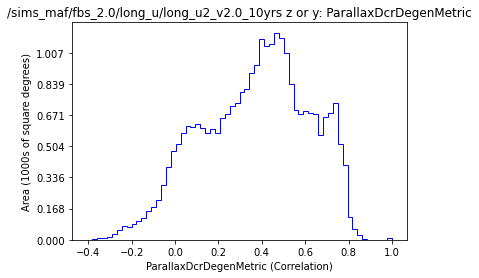

In [4]:
files = glob.glob('/sims_maf/fbs_2.0/long*/*.db')
files.sort()
results = []
for dbFile in files:
    
    runName = dbFile.replace('.db', '')
    conn = db.OpsimDatabase(dbFile)
    
    outDir = runName + '_bdvol'
    outDir=outDir.replace('/sims_maf/fbs_2.0/',"BDresults/")
    resultsDb = db.ResultsDb(outDir=outDir)
    
    nside = 64
    bundleList = []
    #sql = 'filter="z" or filter="y"'
    sql = ''
    # Let's plug in the magnitudes for one type
    metric = BDParallaxMetric(mags={'i': 20.09, 'z': 18.18, 'y': 17.13}, metricName='L7')
    slicer = slicers.HealpixSlicer(nside=nside)
    summaryStats = [VolumeSumMetric(nside=nside)]
    plotDict = {}
    bundleList.append(metricBundles.MetricBundle(metric,slicer,sql, plotDict=plotDict,
                                                 summaryMetrics=summaryStats,
                                                 runName=runName))
    # add DCR degeneracy check...
    sql = 'filter="z" or filter="y"'
    metric = metrics.ParallaxDcrDegenMetric(SedTemplate='M', rmag=20.)
    bundleList.append(metricBundles.MetricBundle(metric,slicer,sql,
                                             runName=runName))
    
    bd = metricBundles.makeBundlesDictFromList(bundleList)
    bg = metricBundles.MetricBundleGroup(bd, conn, outDir=outDir, resultsDb=resultsDb)
    bg.runAll()
    bg.plotAll(closefigs=False)

    results.append(bg)

In [5]:
# Let's see how the total volume changes as we change the footprint
for name, result in zip(files, results):
    key = list(result.bundleDict.keys())[0]
    result.bundleDict[key]
    print(name, result.bundleDict[key].summaryValues)

/sims_maf/fbs_2.0/long_gaps/long_gaps_nightsoff0_delayed-1_v2.0_10yrs.db {'VolumeSum': 189003.696013978}
/sims_maf/fbs_2.0/long_gaps/long_gaps_nightsoff0_delayed1827_v2.0_10yrs.db {'VolumeSum': 198386.33663072073}
/sims_maf/fbs_2.0/long_gaps/long_gaps_nightsoff1_delayed-1_v2.0_10yrs.db {'VolumeSum': 199309.68696449316}
/sims_maf/fbs_2.0/long_gaps/long_gaps_nightsoff1_delayed1827_v2.0_10yrs.db {'VolumeSum': 202031.14519132575}
/sims_maf/fbs_2.0/long_gaps/long_gaps_nightsoff2_delayed-1_v2.0_10yrs.db {'VolumeSum': 201175.29658094718}
/sims_maf/fbs_2.0/long_gaps/long_gaps_nightsoff2_delayed1827_v2.0_10yrs.db {'VolumeSum': 203047.86478413525}
/sims_maf/fbs_2.0/long_gaps/long_gaps_nightsoff3_delayed-1_v2.0_10yrs.db {'VolumeSum': 202144.70517823208}
/sims_maf/fbs_2.0/long_gaps/long_gaps_nightsoff3_delayed1827_v2.0_10yrs.db {'VolumeSum': 203665.73837598978}
/sims_maf/fbs_2.0/long_gaps/long_gaps_nightsoff4_delayed-1_v2.0_10yrs.db {'VolumeSum': 202638.3961945403}
/sims_maf/fbs_2.0/long_gaps/long